In [ ]:
# Import libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# Load dataframes
df = pd.read_csv('/content/drive/MyDrive/Azubi data analytics projects/Project 3 Environment Impact of Food Production/Food_Production.csv')

In [ ]:
# Set pandas to show all data columns
pd.set_option('display.max_columns',23)

In [ ]:
# View dataframe
display(df.head())

,Food product,Land use change,Animal Feed,Farm,Processing,Transport,Packging,Retail,Total_emissions,Eutrophying emissions per 1000kcal (gPO₄eq per 1000kcal),Eutrophying emissions per kilogram (gPO₄eq per kilogram),Eutrophying emissions per 100g protein (gPO₄eq per 100 grams protein),Freshwater withdrawals per 1000kcal (liters per 1000kcal),Freshwater withdrawals per 100g protein (liters per 100g protein),Freshwater withdrawals per kilogram (liters per kilogram),Greenhouse gas emissions per 1000kcal (kgCO₂eq per 1000kcal),Greenhouse gas emissions per 100g protein (kgCO₂eq per 100g protein),Land use per 1000kcal (m² per 1000kcal),Land use per kilogram (m² per kilogram),Land use per 100g protein (m² per 100g protein),Scarcity-weighted water use per kilogram (liters per kilogram),Scarcity-weighted water use per 100g protein (liters per 100g protein),Scarcity-weighted water use per 1000kcal (liters per 1000 kilocalories)
0,Wheat & Rye (Bread),0.1,0.0,0.8,0.2,0.1,0.1,0.1,1.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Maize (Meal),0.3,0.0,0.5,0.1,0.1,0.1,0.0,1.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Barley (Beer),0.0,0.0,0.2,0.1,0.0,0.5,0.3,1.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Oatmeal,0.0,0.0,1.4,0.0,0.1,0.1,0.0,1.6,4.281357,11.23,8.638462,183.911552,371.076923,482.4,0.945482,1.907692,2.897446,7.6,5.846154,18786.2,14450.92308,7162.104461
4,Rice,0.0,0.0,3.6,0.1,0.1,0.1,0.1,4.0,9.514379,35.07,49.394366,609.983722,3166.760563,2248.4,1.207271,6.267606,0.759631,2.8,3.943662,49576.3,69825.77465,13449.891480


In [ ]:
# Check for null values
df.isna().sum()

,0
Food product,0
Land use change,0
Animal Feed,0
Farm,0
Processing,0
Transport,0
Packging,0
Retail,0
Total_emissions,0
Eutrophying emissions per 1000kcal (gPO₄eq per 1000kcal),10


In [ ]:
# Missing value percentage
df_info = pd.DataFrame({"Dtype": df.dtypes, "Row Count": df.shape[0], "Missing%": round((df.isnull().sum()/df.shape[0])*100,2)})
df_info

,Dtype,Row Count,Missing%
Food product,object,43,0.00
Land use change,float64,43,0.00
Animal Feed,float64,43,0.00
Farm,float64,43,0.00
Processing,float64,43,0.00
Transport,float64,43,0.00
Packging,float64,43,0.00
Retail,float64,43,0.00
Total_emissions,float64,43,0.00
Eutrophying emissions per 1000kcal (gPO₄eq per 1000kcal),float64,43,23.26


In [ ]:
# Viewing columns with missing values
df[df.isna().any(axis=1)]

,Food product,Land use change,Animal Feed,Farm,Processing,Transport,Packging,Retail,Total_emissions,Eutrophying emissions per 1000kcal (gPO₄eq per 1000kcal),Eutrophying emissions per kilogram (gPO₄eq per kilogram),Eutrophying emissions per 100g protein (gPO₄eq per 100 grams protein),Freshwater withdrawals per 1000kcal (liters per 1000kcal),Freshwater withdrawals per 100g protein (liters per 100g protein),Freshwater withdrawals per kilogram (liters per kilogram),Greenhouse gas emissions per 1000kcal (kgCO₂eq per 1000kcal),Greenhouse gas emissions per 100g protein (kgCO₂eq per 100g protein),Land use per 1000kcal (m² per 1000kcal),Land use per kilogram (m² per kilogram),Land use per 100g protein (m² per 100g protein),Scarcity-weighted water use per kilogram (liters per kilogram),Scarcity-weighted water use per 100g protein (liters per 100g protein),Scarcity-weighted water use per 1000kcal (liters per 1000 kilocalories)
0,Wheat & Rye (Bread),0.1,0.0,0.8,0.2,0.1,0.1,0.1,1.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Maize (Meal),0.3,0.0,0.5,0.1,0.1,0.1,0.0,1.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Barley (Beer),0.0,0.0,0.2,0.1,0.0,0.5,0.3,1.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Cassava,0.6,0.0,0.2,0.0,0.1,0.0,0.0,0.9,0.708419,0.69,7.666667,NaN,NaN,0.0,1.355236,14.666667,1.858316,1.81,20.111111,0.0,NaN,NaN
7,Cane Sugar,1.2,0.0,0.5,0.0,0.8,0.1,0.0,2.6,4.820513,16.92,NaN,176.666667,NaN,620.1,0.911681,NaN,0.581197,2.04,NaN,16438.6,NaN,4683.361823
8,Beet Sugar,0.0,0.0,0.5,0.2,0.6,0.1,0.0,1.4,1.541311,5.41,NaN,62.022792,NaN,217.7,0.515670,NaN,0.521368,1.83,NaN,9493.3,NaN,2704.643875
9,Other Pulses,0.0,0.0,1.1,0.0,0.1,0.4,0.0,1.6,5.008798,17.08,7.977581,NaN,203.503036,435.7,0.524927,0.836058,4.565982,15.57,7.272303,22477.4,10498.55208,NaN
10,Peas,0.0,0.0,0.7,0.0,0.1,0.0,0.0,0.8,2.173410,7.52,3.384338,NaN,178.487849,396.6,0.283237,0.441044,2.156069,7.46,3.357336,27948.2,12577.94779,NaN
13,Soymilk,0.2,0.0,0.1,0.2,0.1,0.1,0.3,1.0,NaN,1.06,NaN,NaN,NaN,27.8,NaN,NaN,NaN,0.66,NaN,955.6,NaN,NaN
14,Tofu,1.0,0.0,0.5,0.8,0.2,0.2,0.3,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


The missing values are found in columns 'eutrophying emissions' to 'scarcity-weighted water'. The column ranges are among the different types of metrics used to quantify environmental pollution.<br> The respective crops with N/A's in columns show that they do not cause that specific kind of pollution. Their values will thus be replaced with 0.

In [ ]:
df = df.fillna(0)

In [ ]:
# Check for duplicates
int(df.duplicated().sum())

0

In [ ]:
# View summary data statistics
df.describe()

,Land use change,Animal Feed,Farm,Processing,Transport,Packging,Retail,Total_emissions,Eutrophying emissions per 1000kcal (gPO₄eq per 1000kcal),Eutrophying emissions per kilogram (gPO₄eq per kilogram),Eutrophying emissions per 100g protein (gPO₄eq per 100 grams protein),Freshwater withdrawals per 1000kcal (liters per 1000kcal),Freshwater withdrawals per 100g protein (liters per 100g protein),Freshwater withdrawals per kilogram (liters per kilogram),Greenhouse gas emissions per 1000kcal (kgCO₂eq per 1000kcal),Greenhouse gas emissions per 100g protein (kgCO₂eq per 100g protein),Land use per 1000kcal (m² per 1000kcal),Land use per kilogram (m² per kilogram),Land use per 100g protein (m² per 100g protein),Scarcity-weighted water use per kilogram (liters per kilogram),Scarcity-weighted water use per 100g protein (liters per 100g protein),Scarcity-weighted water use per 1000kcal (liters per 1000 kilocalories)
count,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000
mean,1.260465,0.453488,3.469767,0.253488,0.195349,0.269767,0.069767,5.972093,20.860257,40.776047,33.135878,351.759752,869.473451,824.162791,4.323724,8.492383,9.534057,25.861628,18.275259,32350.751163,35793.195374,12125.982843
std,3.357730,0.919200,7.083264,0.372475,0.158795,0.342633,0.110270,10.501753,42.173510,79.151355,48.396627,505.559316,1320.512015,1254.370907,9.572196,16.655345,25.308187,74.279031,41.323921,54701.845169,75308.427005,15721.359204
min,-2.100000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.350000,0.000000,0.100000,0.100000,0.000000,0.850000,0.957716,2.350000,0.000000,0.000000,0.000000,43.750000,0.176578,0.000000,0.397562,0.730000,0.000000,943.800000,0.000000,0.000000
50%,0.200000,0.000000,0.800000,0.100000,0.100000,0.100000,0.000000,1.600000,4.754098,10.650000,11.726883,114.015837,284.000000,369.800000,0.911681,2.705882,1.997738,2.420000,3.943662,10593.700000,8185.854503,3762.568306
75%,0.800000,0.000000,2.200000,0.300000,0.200000,0.300000,0.150000,6.000000,17.296663,36.165000,46.375941,550.140858,1191.055487,833.950000,4.196842,9.527778,4.460075,12.590000,17.222222,31340.350000,44916.778855,21650.819220
max,16.300000,2.900000,39.400000,1.300000,0.800000,1.600000,0.300000,59.600000,197.357143,365.290000,185.050659,2062.178771,6003.333333,5605.200000,50.946429,93.300000,119.490842,369.810000,184.812594,229889.800000,431620.000000,49735.882350


### Initial visualisation

In [ ]:
# Variable to hold column names
col_names = list(df.columns)
col_names.pop(0)
col_names

['Land use change',
 'Animal Feed',
 'Farm',
 'Processing',
 'Transport',
 'Packging',
 'Retail',
 'Total_emissions',
 'Eutrophying emissions per 1000kcal (gPO₄eq per 1000kcal)',
 'Eutrophying emissions per kilogram (gPO₄eq per kilogram)',
 'Eutrophying emissions per 100g protein (gPO₄eq per 100 grams protein)',
 'Freshwater withdrawals per 1000kcal (liters per 1000kcal)',
 'Freshwater withdrawals per 100g protein (liters per 100g protein)',
 'Freshwater withdrawals per kilogram (liters per kilogram)',
 'Greenhouse gas emissions per 1000kcal (kgCO₂eq per 1000kcal)',
 'Greenhouse gas emissions per 100g protein (kgCO₂eq per 100g protein)',
 'Land use per 1000kcal (m² per 1000kcal)',
 'Land use per kilogram (m² per kilogram)',
 'Land use per 100g protein (m² per 100g protein)',
 'Scarcity-weighted water use per kilogram (liters per kilogram)',
 'Scarcity-weighted water use per 100g protein (liters per 100g protein)',
 'Scarcity-weighted water use per 1000kcal (liters per 1000 kilocalories

Horizontal bar plot to inspect metric performance on each food product

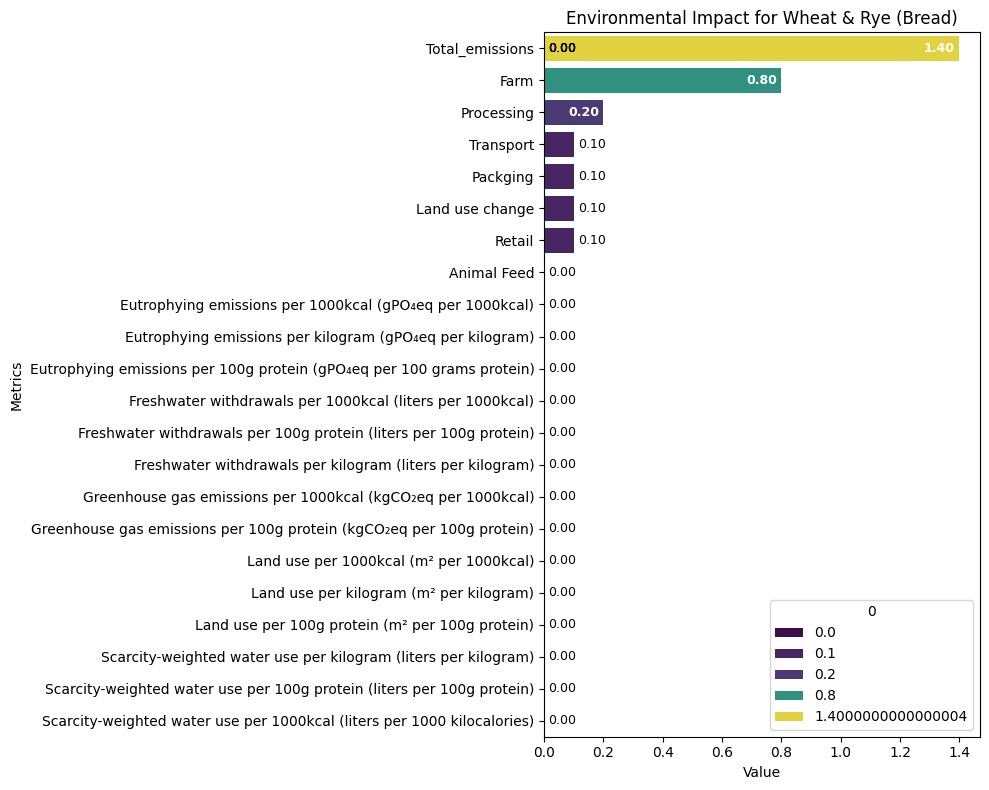

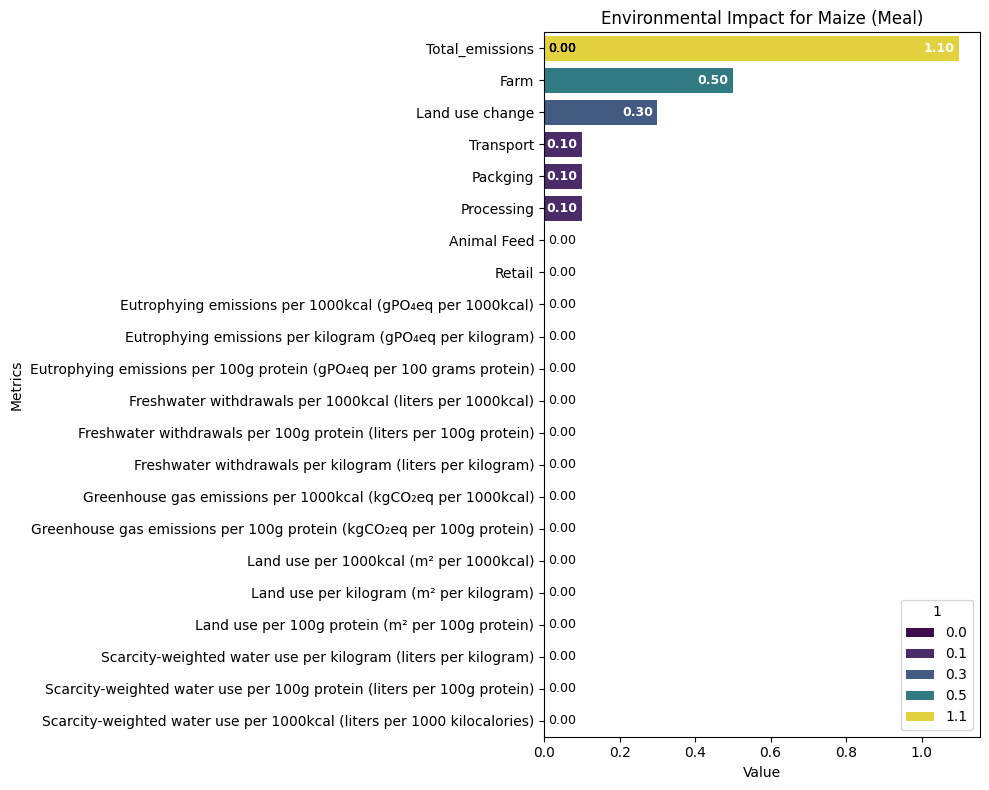

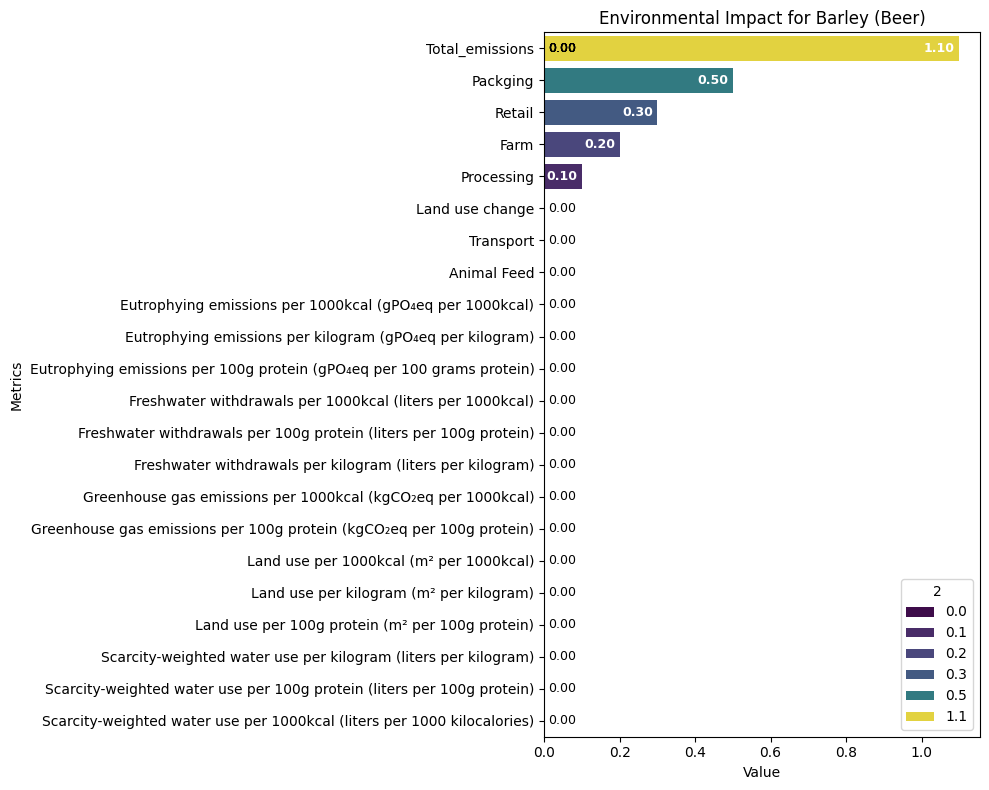

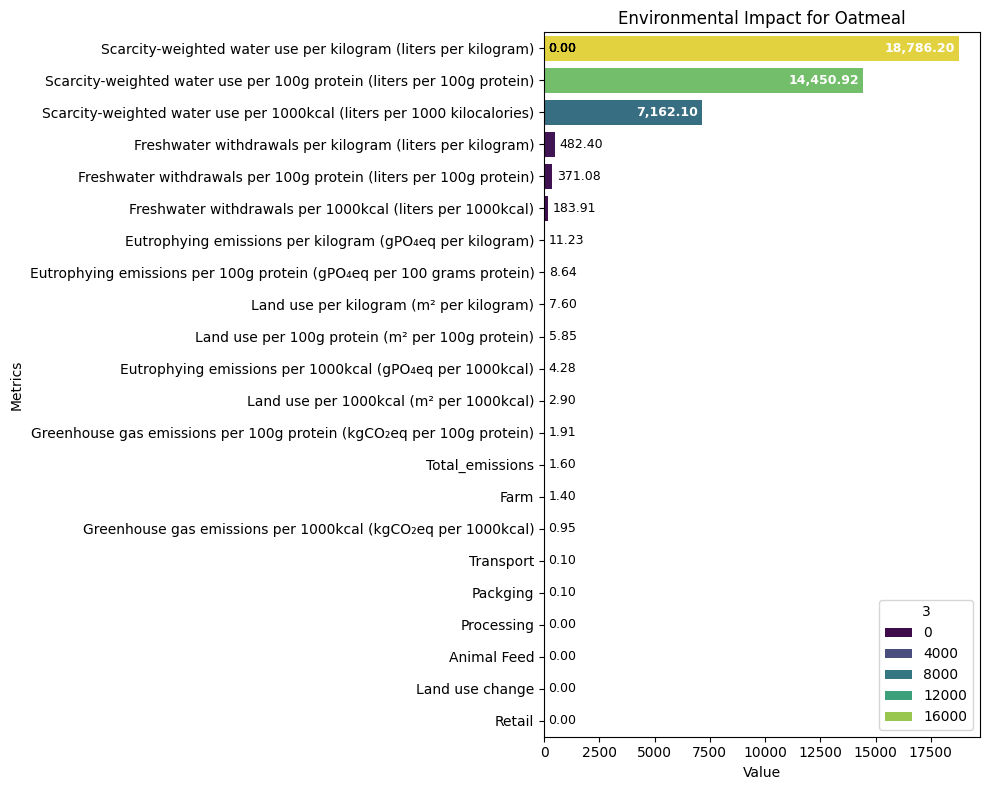

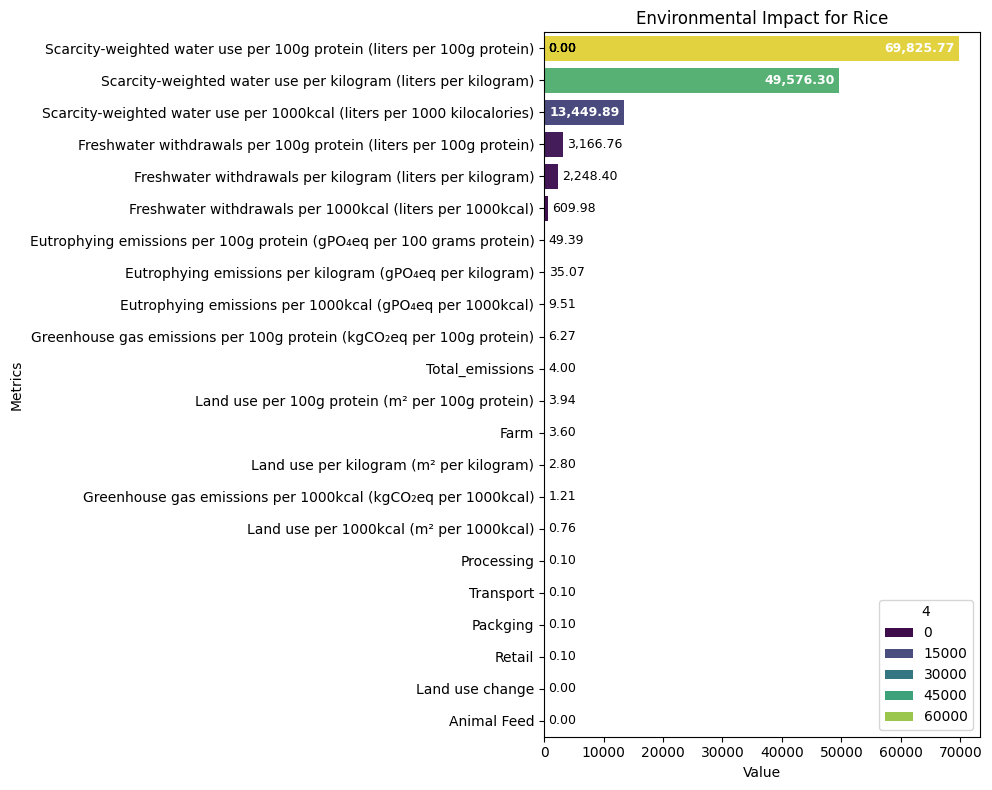

...

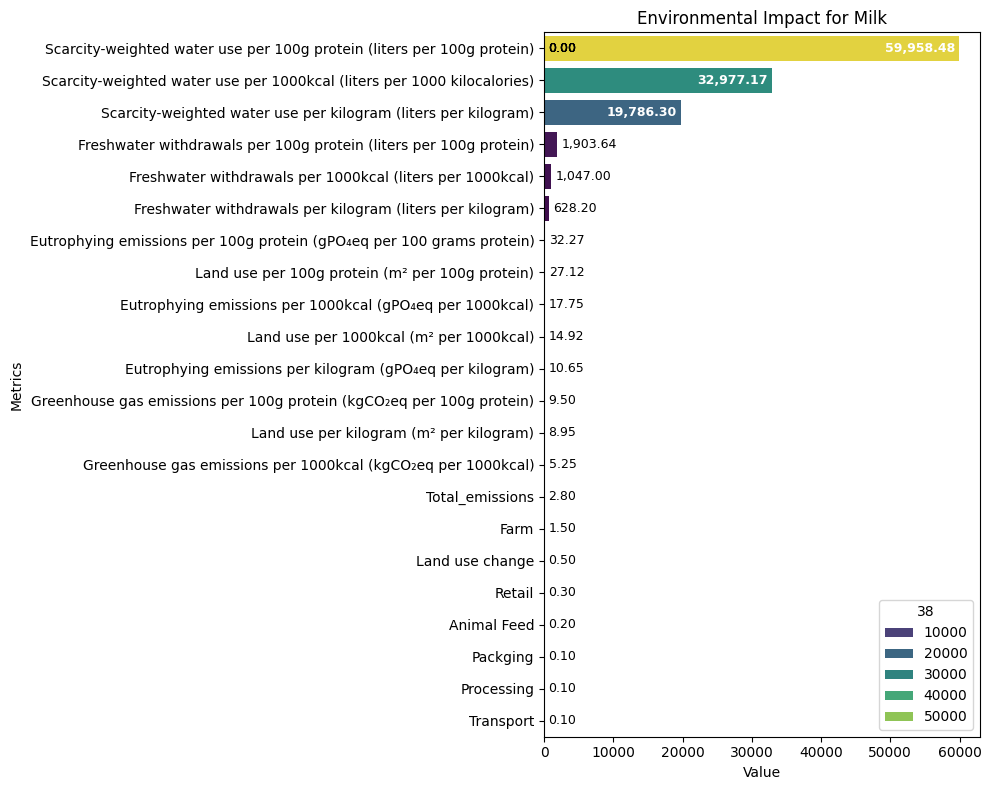

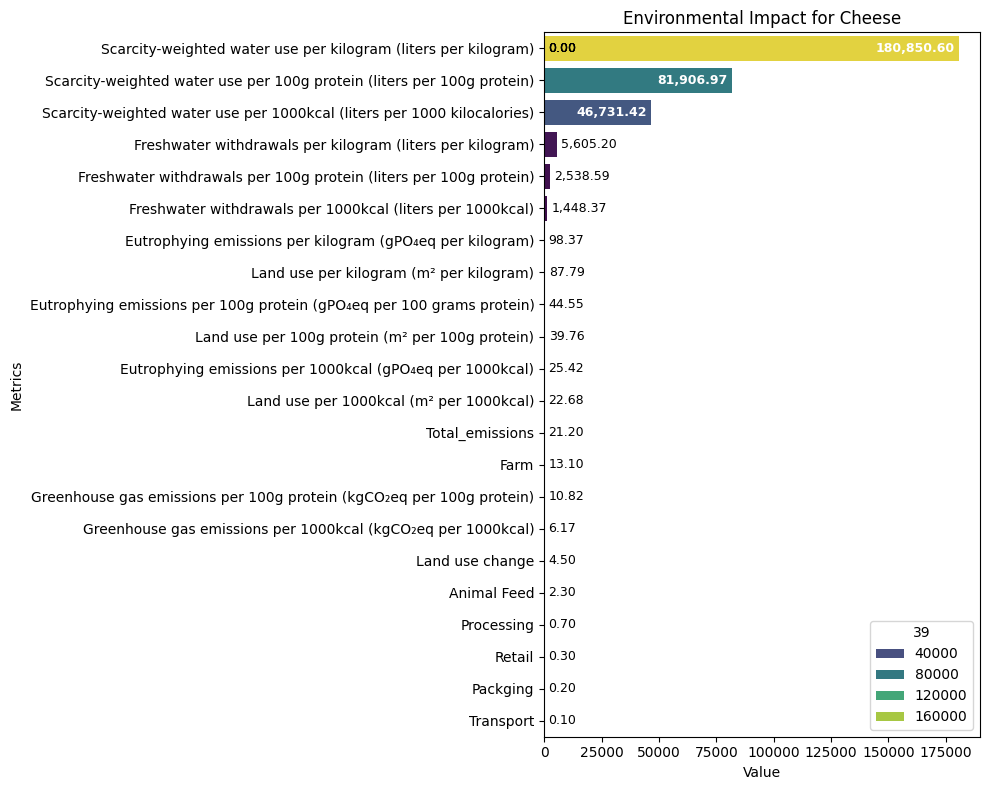

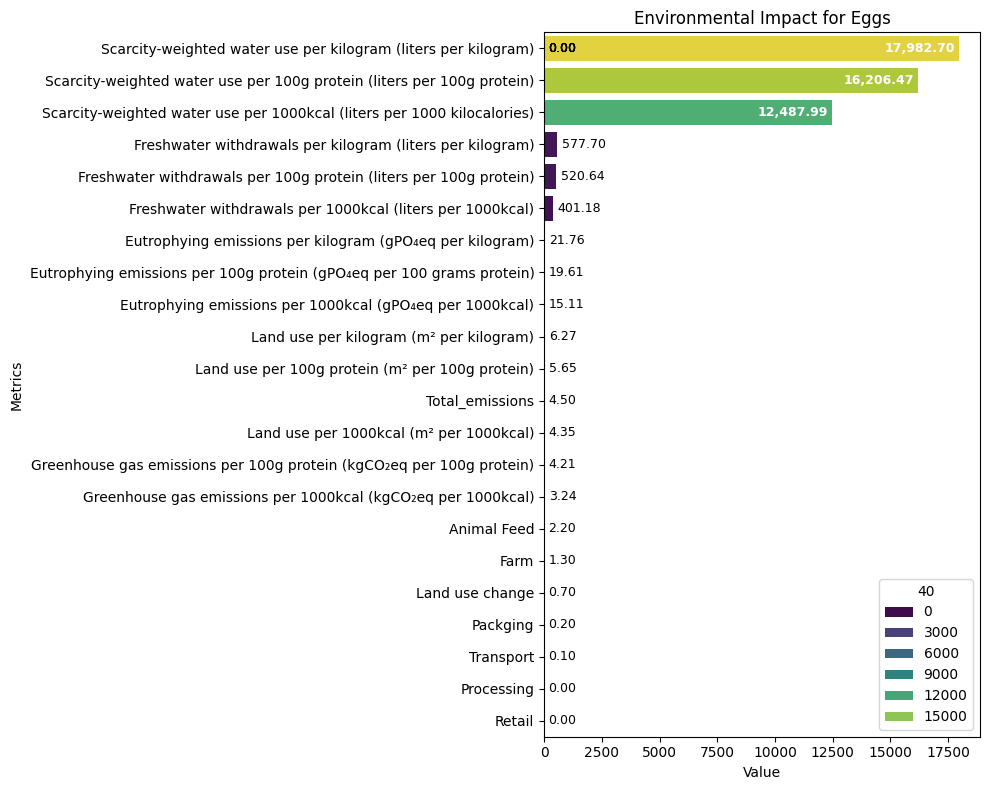

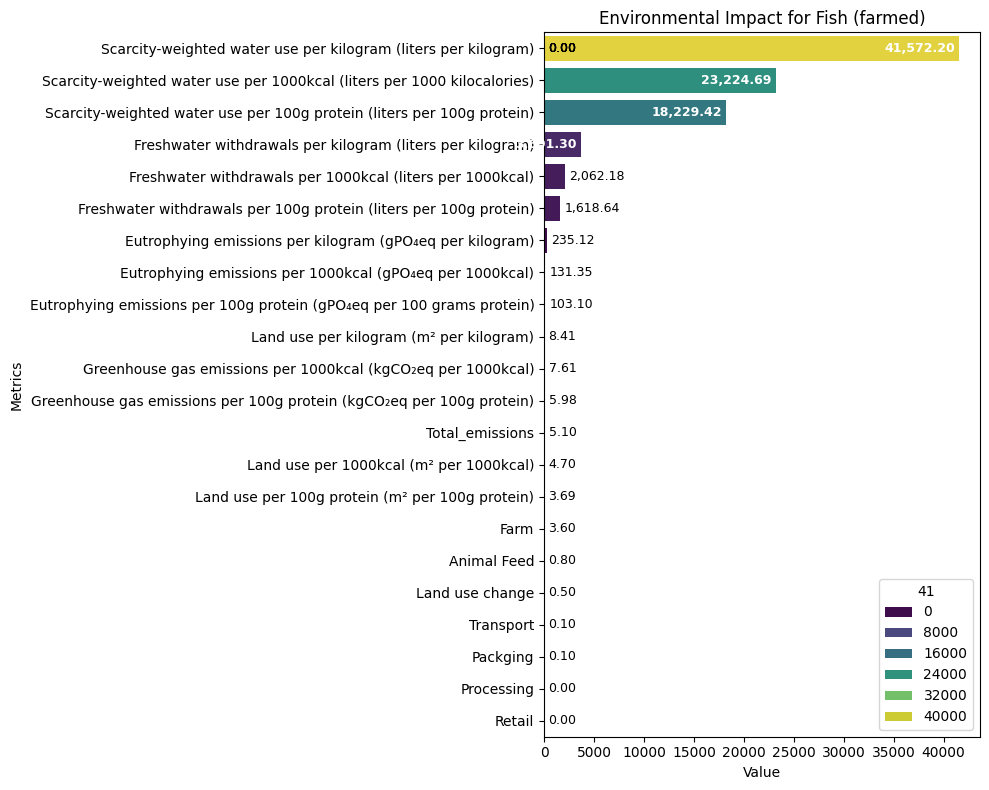

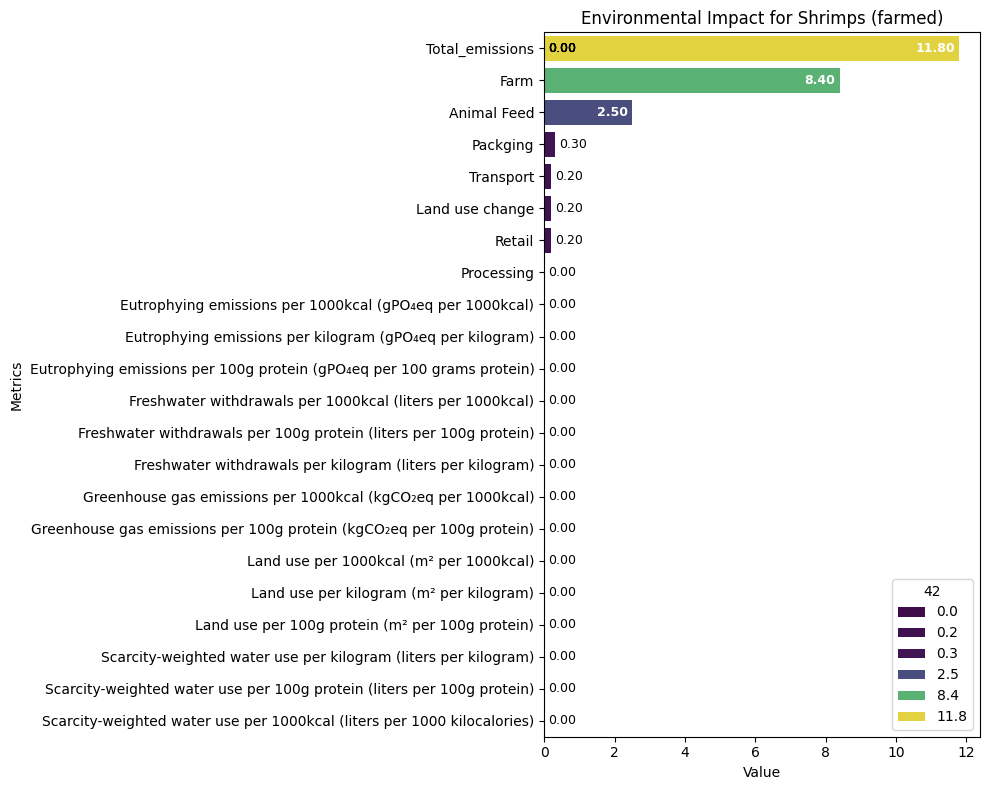

In [ ]:
# numeric columns only
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

for food_product in df['Food product'].unique():
    # get first matching row for product
    product_series = df.loc[df['Food product'] == food_product, numeric_cols].iloc[0]
    # sort descending so largest appears at top
    product_series = product_series.sort_values(ascending=False)

    fig, ax = plt.subplots(figsize=(10, 8))
    sns.barplot(x=product_series.values, y=product_series.index, ax=ax, palette="viridis", hue=product_series)
    ax.set_xlabel('Value')
    ax.set_ylabel('Metrics')
    ax.set_title(f'Environmental Impact for {food_product}')

    # get axis limits and small offset for label placement
    x_min, x_max = ax.get_xlim()
    x_span = x_max - x_min if (x_max - x_min) != 0 else 1.0
    offset = x_span * 0.01  # 1% of span

    # add labels
    for p in ax.patches:
        width = p.get_width()
        y = p.get_y() + p.get_height() / 2

        # format label nicely (change .2f to .0f if you want integers)
        if np.isnan(width):
            label = ""
        else:
            label = f"{width:,.2f}"

        # decide if label goes inside or outside
        if width >= 0:
            # if bar is wide enough place label inside (right-aligned), else outside to the right
            if width >= x_span * 0.07:
                ax.text(width - offset, y, label, va='center', ha='right', color='white', fontweight='bold', fontsize=9)
            else:
                ax.text(width + offset, y, label, va='center', ha='left', fontsize=9)
        else:
            # negative values: put label to the left
            ax.text(width - offset, y, label, va='center', ha='right', fontsize=9)

    plt.tight_layout()
    plt.show()


The metrics harmonised per product presented different answer scales. For certain food products, there were higher readings in scarcity-weighted water as compared to transport which means the metrics cannot be suitably scaled for analysis.

The above realisation necessitates the need to group food products before analysis. The food products will be grouped based on their food type eg. carbohydrates, fruits and vegetables.

Understand the metrics and food groupings<br>

---


Carbohydrates/ Staples
* Wheat & Rye (Bread), Maize (Meal), Barley (Beer) -->Total Emissions, Farm, Processing, Transport, Packaging, Land use change, Retail
* Oatmeal, Rice, Potatoes, --> Scarcity and Fresh water metrics<br>
* Cassava --> Land use, Green house, eutrophying, farm, transport, total emissions metrics

Sugars
* Cane Sugar, Beet Sugar --> Scarcity and freshwater metrics

Legumes
* Other Pulses, Peas, Nuts, Groundnuts, Soymilk --> Scarcity and fresh water metrics

Oils
* Soybean Oil, Sunflower Oil, Rapeseed Oil, Olive Oil --> Scarcity and fresh water metrics
* Palm Oil  --> different metrics

Vegetables
* Tomatoes, Onions & Leeks, Root Vegetables, Brassicas, Other Vegetables --> Scarcity and Fresh water metrics (eutrophying)

Fruits
* Citrus Fruit, Bananas, Apples, Berries & Grapes, Other Fruit --> scarcity and fresh water metrics (eutrophying)

Beverages
* Wine, Coffee, Dark Chocolate, Tofu --> very different

Meat
* Beef (beef herd), Beef (dairy herd), Lamb & Mutton, Pig Meat, Poultry Meat --> Scarcity, Freshwater, Eutrophying, Land use

Animal Products (Dairy/ Non-Dairy)
* Milk, Cheese, Eggs --> scarcity and fresh water

Seafood
* Fish (farmed) --> scarcity, freshwater, eutrophying
* Shrimps (farmed) --> very different


### Deep Dive

In [ ]:
# Obtaining unique food products
df['Food product'].unique()#.shape[0]

array(['Wheat & Rye (Bread)', 'Maize (Meal)', 'Barley (Beer)', 'Oatmeal',
       'Rice', 'Potatoes', 'Cassava', 'Cane Sugar', 'Beet Sugar',
       'Other Pulses', 'Peas', 'Nuts', 'Groundnuts', 'Soymilk', 'Tofu',
       'Soybean Oil', 'Palm Oil', 'Sunflower Oil', 'Rapeseed Oil',
       'Olive Oil', 'Tomatoes', 'Onions & Leeks', 'Root Vegetables',
       'Brassicas', 'Other Vegetables', 'Citrus Fruit', 'Bananas',
       'Apples', 'Berries & Grapes', 'Wine', 'Other Fruit', 'Coffee',
       'Dark Chocolate', 'Beef (beef herd)', 'Beef (dairy herd)',
       'Lamb & Mutton', 'Pig Meat', 'Poultry Meat', 'Milk', 'Cheese',
       'Eggs', 'Fish (farmed)', 'Shrimps (farmed)'], dtype=object)

In [ ]:
# Grouping food products into food groups

df_vegetables = df.loc[df['Food product'].isin(['Tomatoes', 'Onions & Leeks', 'Root Vegetables', 'Brassicas', 'Other Vegetables'])]
df_fruits = df.loc[df['Food product'].isin(['Citrus Fruit', 'Bananas', 'Apples', 'Berries & Grapes', 'Other Fruit'])]
df_legumes = df.loc[df['Food product'].isin(['Other Pulses', 'Peas', 'Nuts', 'Groundnuts', 'Soymilk'])]
df_sugars = df.loc[df['Food product'].isin(['Cane Sugar', 'Beet Sugar'])]
df_beverages = df.loc[df['Food product'].isin(['Wine', 'Coffee', 'Dark Chocolate', 'Tofu'])]
df_meat = df.loc[df['Food product'].isin(['Beef (beef herd)', 'Beef (dairy herd)', 'Lamb & Mutton', 'Pig Meat', 'Poultry Meat'])]
df_animal_products = df.loc[df['Food product'].isin(['Milk', 'Cheese', 'Eggs'])]
df_seafood = df.loc[df['Food product'].isin(['Fish (farmed)', 'Shrimps (farmed)'])]
df_oils = df.loc[df['Food product'].isin(['Soybean Oil', 'Sunflower Oil', 'Rapeseed Oil', 'Olive Oil', 'Palm Oil'])]
df_carbohydrates = df.loc[df['Food product'].isin(['Wheat & Rye (Bread)', 'Maize (Meal)', 'Barley (Beer)', 'Oatmeal', 'Rice', 'Potatoes','Cassava'])]

In [ ]:
# Inspect df_vegetables dataframe
df_vegetables.head()

,Food product,Land use change,Animal Feed,Farm,Processing,Transport,Packging,Retail,Total_emissions,Eutrophying emissions per 1000kcal (gPO₄eq per 1000kcal),Eutrophying emissions per kilogram (gPO₄eq per kilogram),Eutrophying emissions per 100g protein (gPO₄eq per 100 grams protein),Freshwater withdrawals per 1000kcal (liters per 1000kcal),Freshwater withdrawals per 100g protein (liters per 100g protein),Freshwater withdrawals per kilogram (liters per kilogram),Greenhouse gas emissions per 1000kcal (kgCO₂eq per 1000kcal),Greenhouse gas emissions per 100g protein (kgCO₂eq per 100g protein),Land use per 1000kcal (m² per 1000kcal),Land use per kilogram (m² per kilogram),Land use per 100g protein (m² per 100g protein),Scarcity-weighted water use per kilogram (liters per kilogram),Scarcity-weighted water use per 100g protein (liters per 100g protein),Scarcity-weighted water use per 1000kcal (liters per 1000 kilocalories)
20,Tomatoes,0.4,0.0,0.7,0.0,0.2,0.1,0.0,1.4,39.526316,7.51,68.272727,1946.315789,3361.818182,369.8,11.000000,19.000000,4.210526,0.80,7.272727,5335.7,48506.363640,28082.631580
21,Onions & Leeks,0.0,0.0,0.2,0.0,0.1,0.0,0.0,0.3,8.756757,3.24,24.923077,38.648649,110.000000,14.3,1.351351,3.846154,1.054054,0.39,3.000000,932.0,7169.230769,2518.918919
22,Root Vegetables,0.0,0.0,0.2,0.0,0.1,0.0,0.0,0.3,4.351351,1.61,16.100000,76.756757,284.000000,28.4,1.162162,4.300000,0.891892,0.33,3.300000,929.2,9292.000000,2511.351351
23,Brassicas,0.0,0.0,0.3,0.0,0.1,0.0,0.0,0.4,29.470588,5.01,45.545455,702.352941,1085.454545,119.4,3.000000,4.636364,3.235294,0.55,5.000000,8455.1,76864.545450,49735.882350
24,Other Vegetables,0.0,0.0,0.2,0.1,0.2,0.0,0.0,0.5,0.000000,2.27,0.000000,0.000000,0.000000,102.5,0.000000,0.000000,0.000000,0.38,0.000000,4911.4,0.000000,0.000000


In [ ]:
df_dict = {"Vegetables":df_vegetables, "Fruits":df_fruits, "Legumes":df_legumes, "Sugars":df_sugars, "Beverages":df_beverages,
           "Meat":df_meat, "Animal products":df_animal_products, "Seafood":df_seafood, "Oils":df_oils, "Carbohydrates":df_carbohydrates}

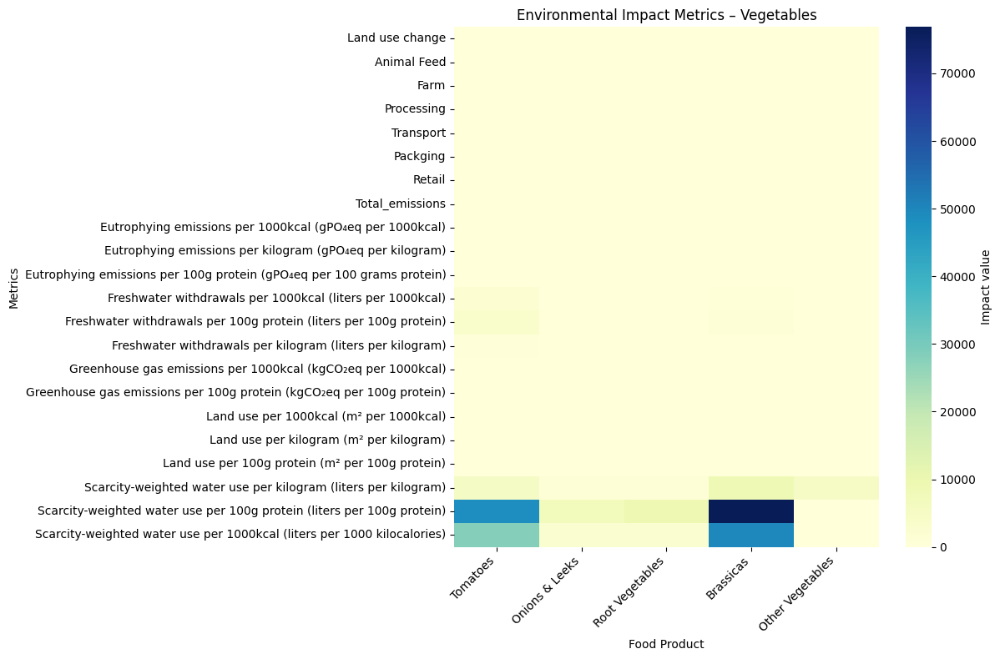

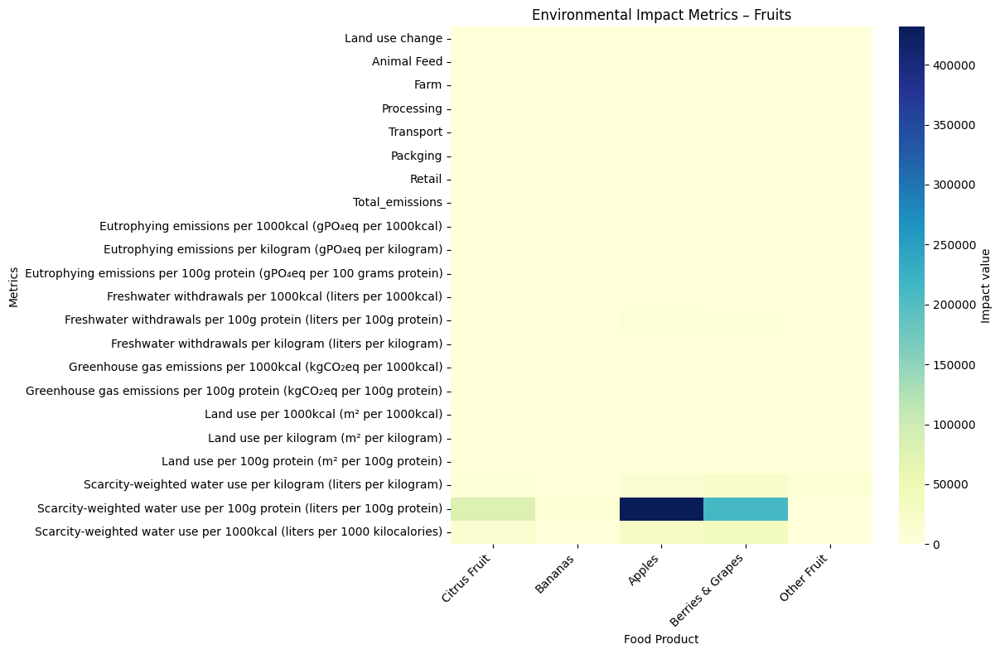

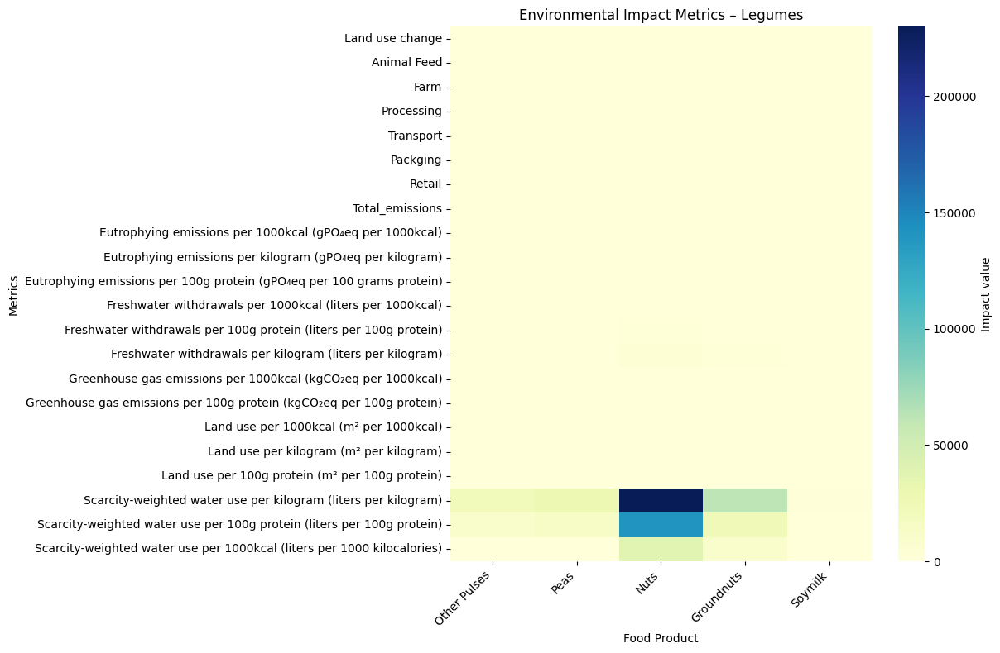

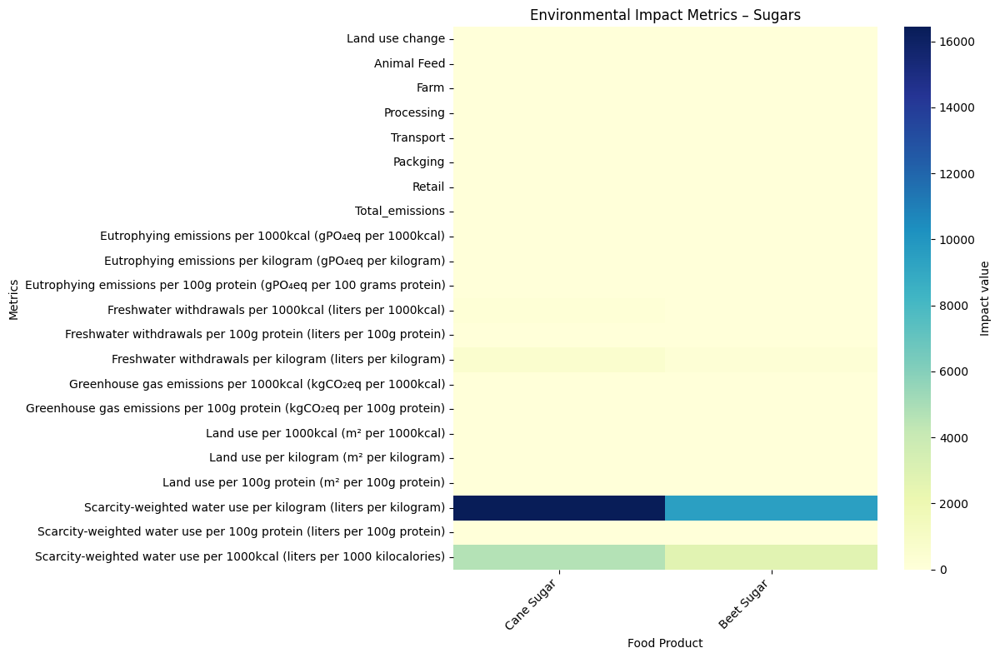

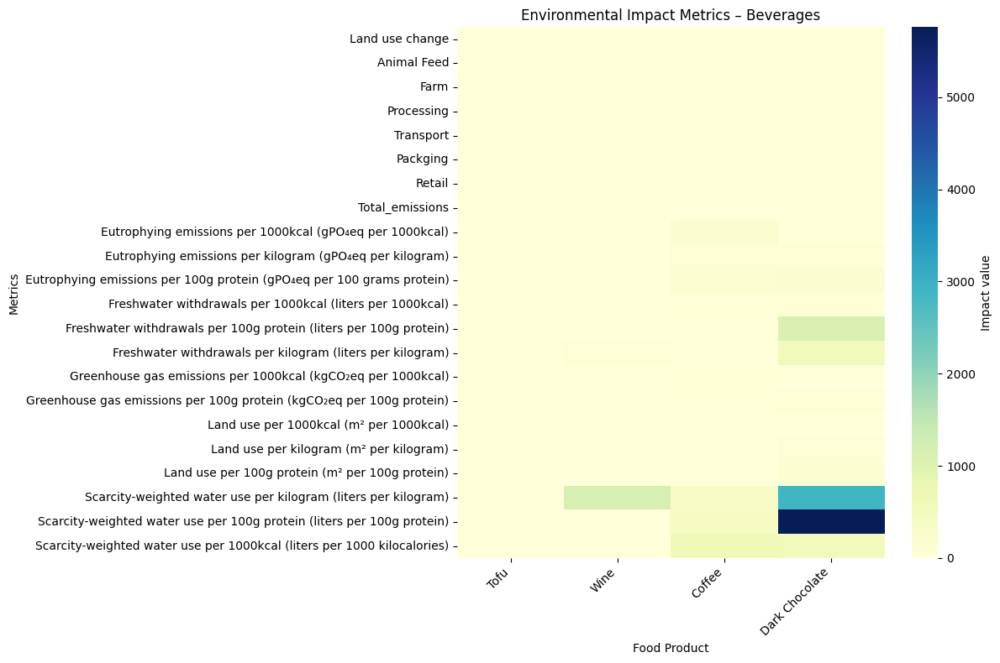

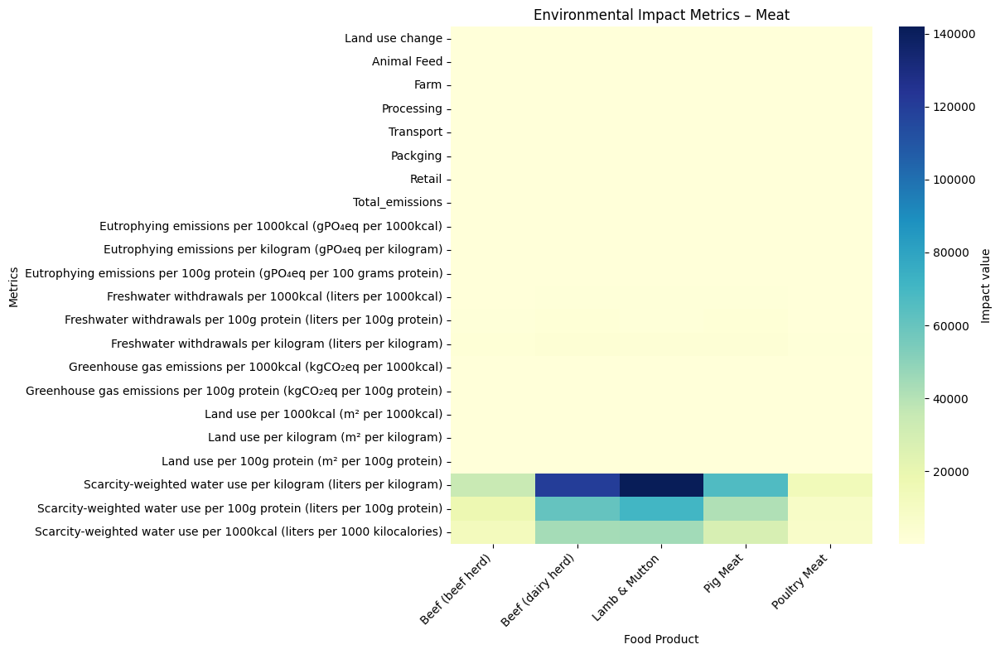

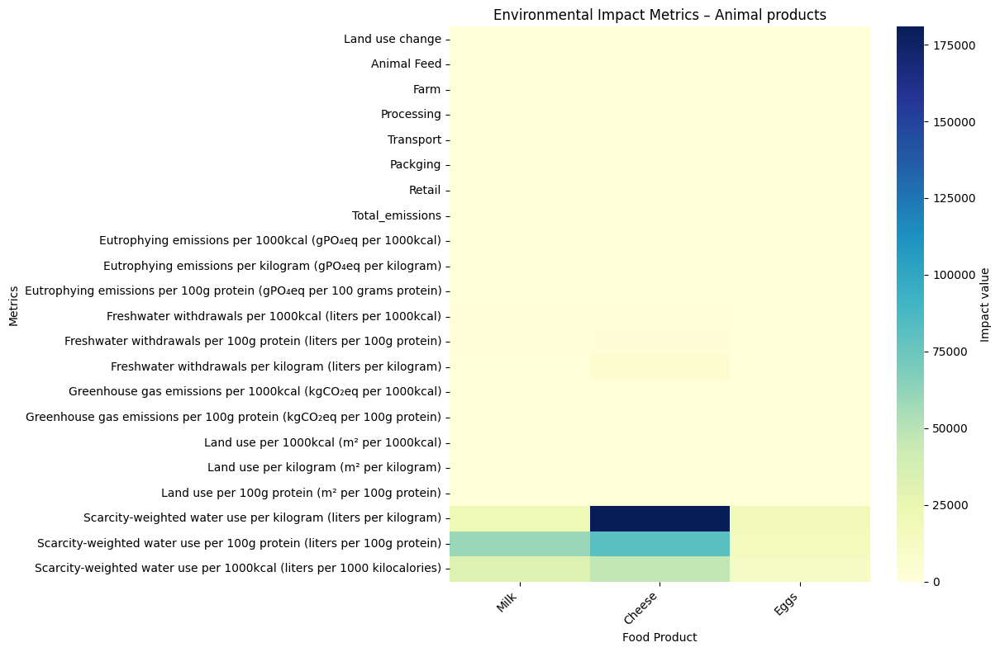

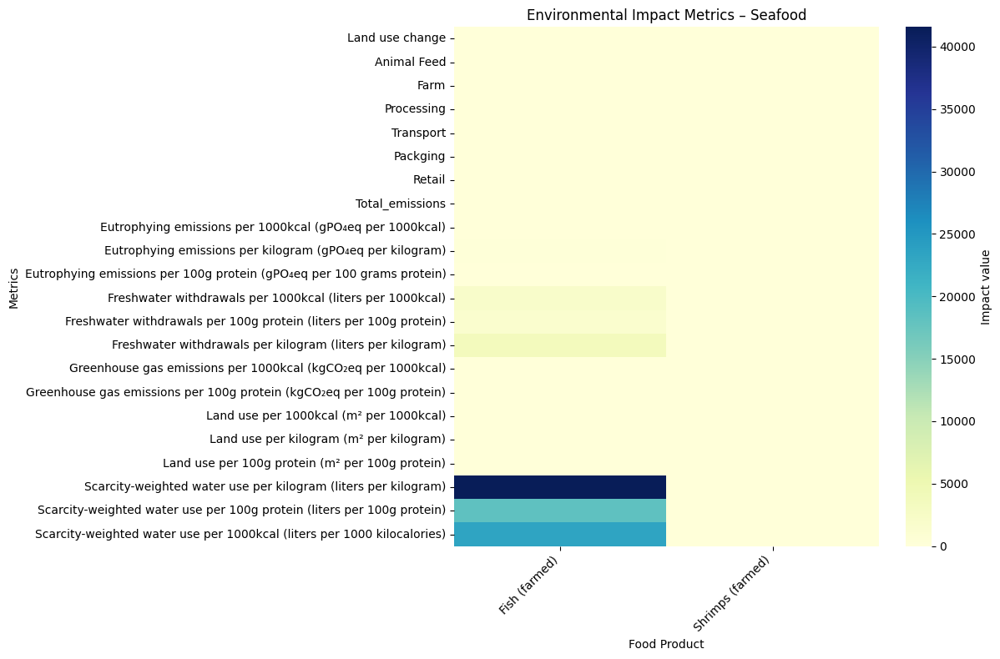

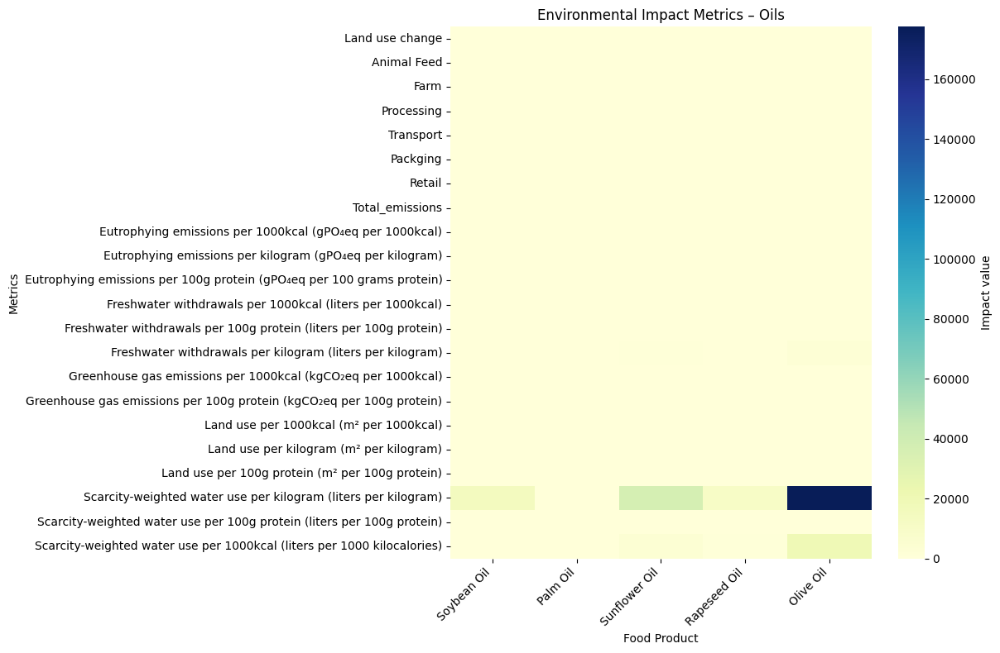

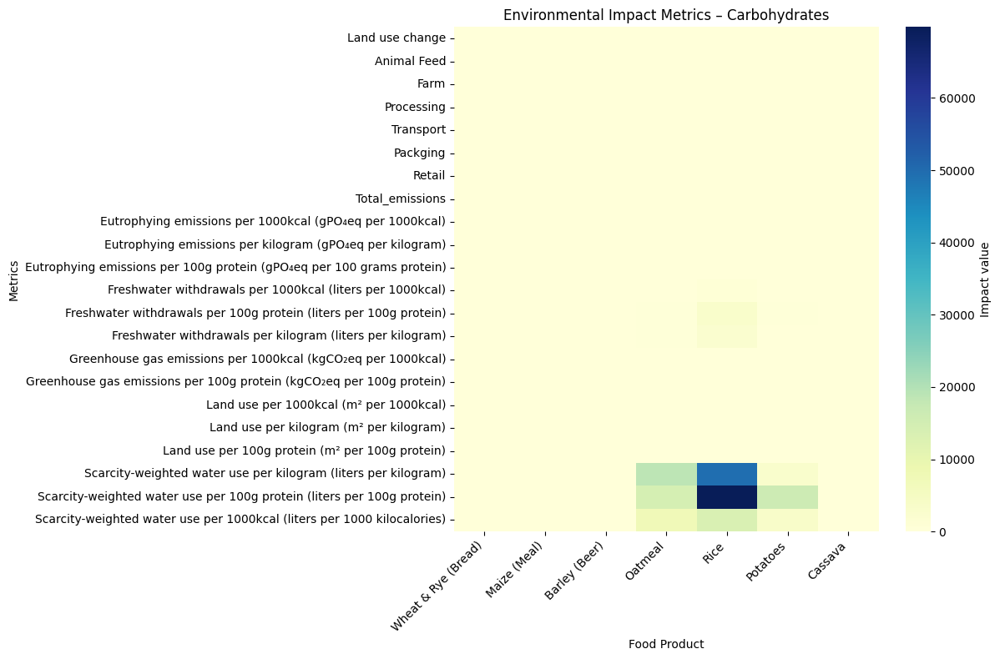

In [ ]:
for name, df_value in df_dict.items():
    plt.figure(figsize=(12, 8))

    # Make "Food product" the index, transpose so rows = metrics, cols = products
    heatmap_data = df_value.set_index('Food product').T

    # Plot the heatmap
    sns.heatmap(heatmap_data, cmap="YlGnBu", annot=False, cbar_kws={'label': 'Impact value'})

    # Add labels & formatting
    plt.title(f'Environmental Impact Metrics – {name}')
    plt.xlabel('Food Product')
    plt.ylabel('Metrics')
    plt.xticks(rotation=45, ha="right")
    plt.yticks(rotation=0)

    plt.tight_layout()
    plt.show()


The uneveness in metric value ranges caused the heatmap columns to appear more prominent for certain metric values than others. Min-max values for transport differ widely from those of scarcity-weighted water use. A much better way to analyse the data is needed.

In [ ]:
# Grouping metrics to related terms

metrics_dict = {"GHG Emissions":['Land use change','Animal Feed','Farm','Processing','Transport','Packging','Retail','Total_emissions','Greenhouse gas emissions per 1000kcal (kgCO₂eq per 1000kcal)',
                                 'Greenhouse gas emissions per 100g protein (kgCO₂eq per 100g protein)'],
                "Water use":['Freshwater withdrawals per 1000kcal (liters per 1000kcal)','Freshwater withdrawals per 100g protein (liters per 100g protein)','Freshwater withdrawals per kilogram (liters per kilogram)',
                             'Scarcity-weighted water use per kilogram (liters per kilogram)','Scarcity-weighted water use per 100g protein (liters per 100g protein)','Scarcity-weighted water use per 1000kcal (liters per 1000 kilocalories)'],
                "Land use":['Land use per 1000kcal (m² per 1000kcal)', 'Land use per kilogram (m² per kilogram)', 'Land use per 100g protein (m² per 100g protein)'],
                "Nutrient pollution":['Eutrophying emissions per 1000kcal (gPO₄eq per 1000kcal)','Eutrophying emissions per kilogram (gPO₄eq per kilogram)','Eutrophying emissions per 100g protein (gPO₄eq per 100 grams protein)']}

Within food groupings there are similarities in their pollution effect. It is not holistic to analyse all food products under some common metrics. The chart shows this group similarity as well as certain products that behave differently probably due to their demand. Next steps are to investigate this observation.

Average values for metric groups vs food product groups

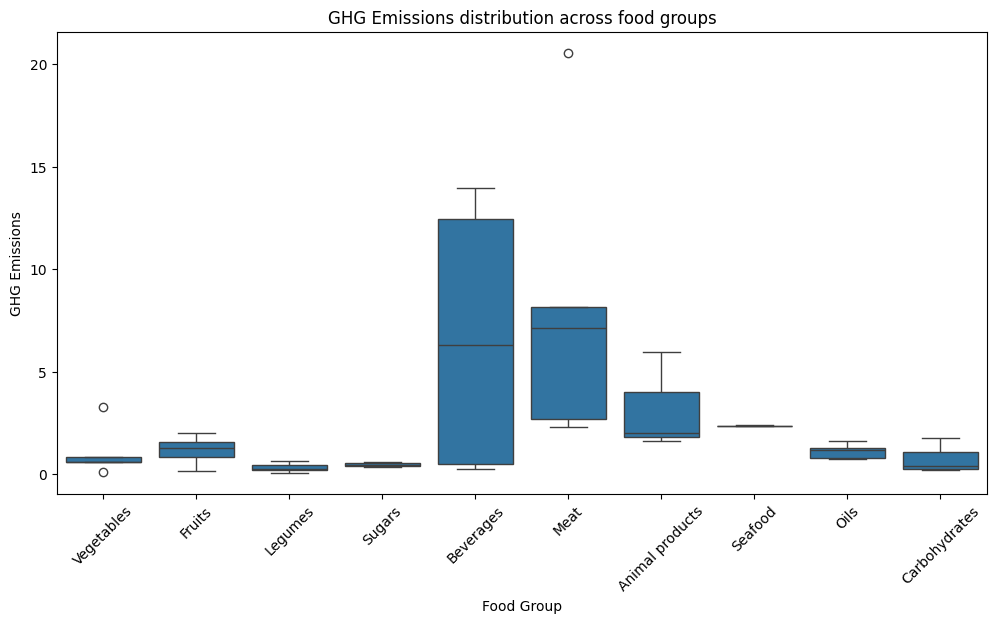

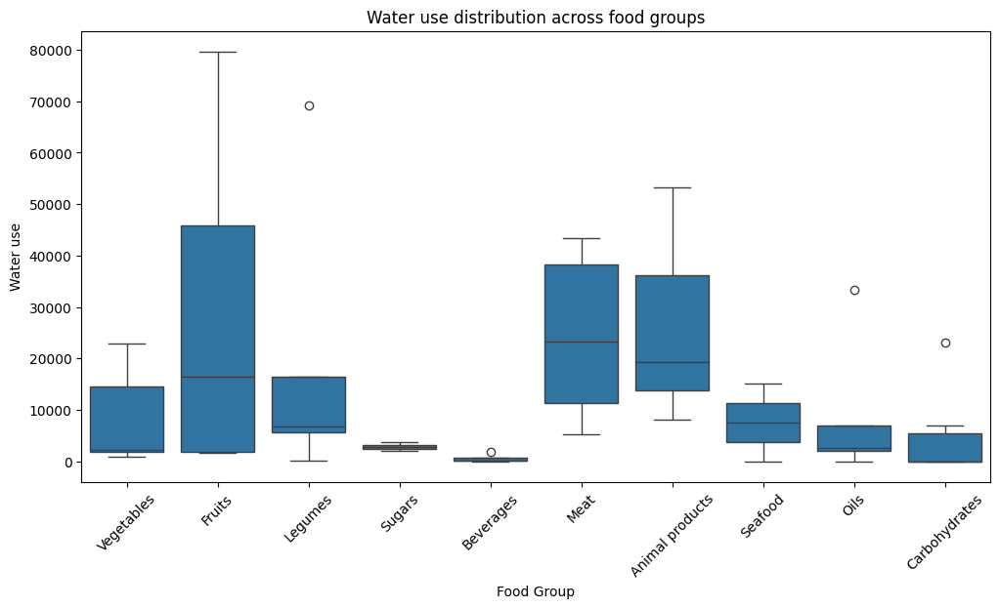

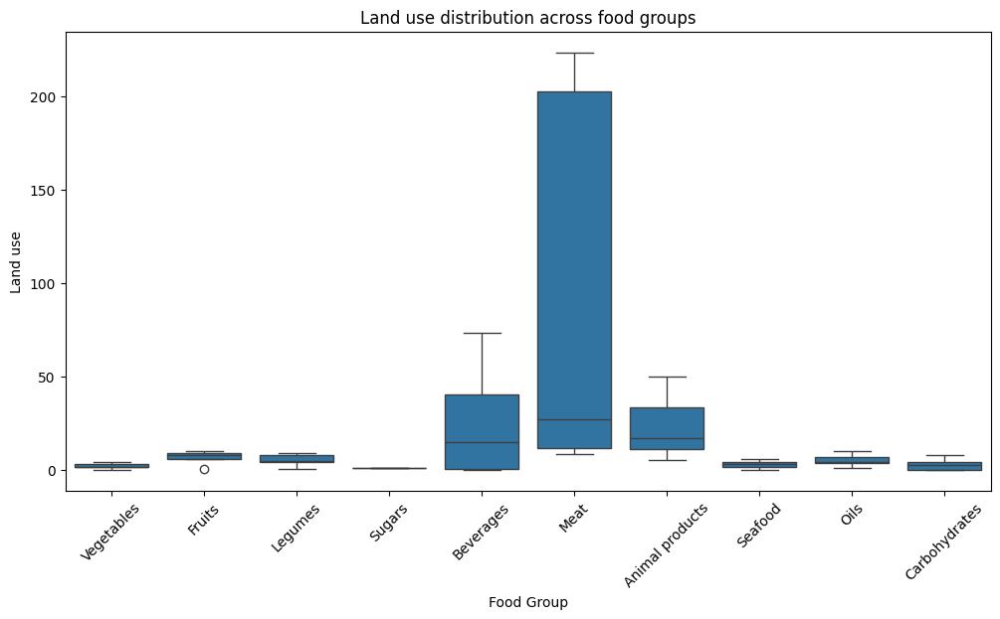

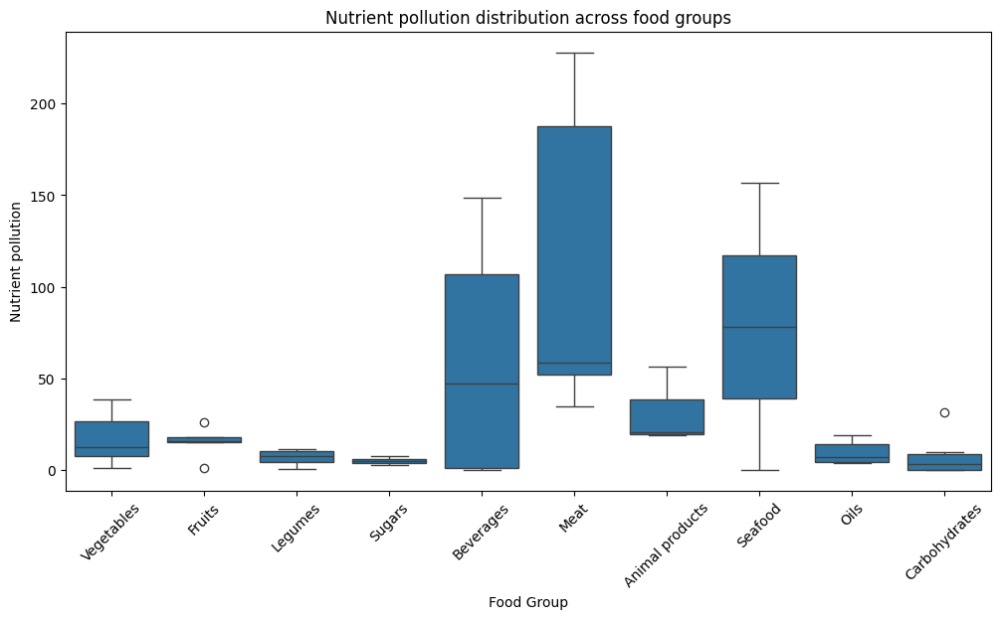

In [ ]:
for metric_group, metric_cols in metrics_dict.items():
    plt.figure(figsize=(12,6))

    # compute mean across the group of metrics
    group_means = {fg: df[metric_cols].mean(axis=1) for fg, df in df_dict.items()}
    plot_df = pd.DataFrame(group_means).melt(var_name="Food Group", value_name=metric_group)

    sns.boxplot(data=plot_df, x="Food Group", y=metric_group)
    plt.xticks(rotation=45)
    plt.title(f"{metric_group} distribution across food groups")
    plt.show()


Bi-metric group analysis of Food groups

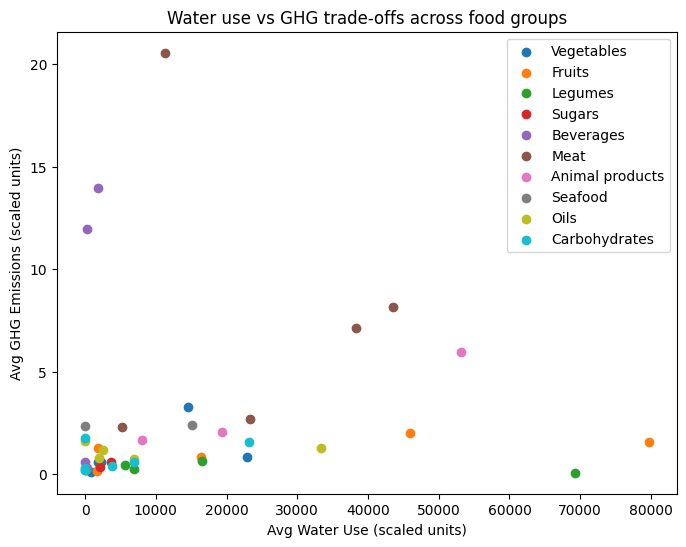

In [ ]:
plt.figure(figsize=(8,6))

for fg, df in df_dict.items():
    x = df[metrics_dict["Water use"]].mean(axis=1)
    y = df[metrics_dict["GHG Emissions"]].mean(axis=1)
    plt.scatter(x, y, label=fg)

plt.xlabel("Avg Water Use (scaled units)")
plt.ylabel("Avg GHG Emissions (scaled units)")
plt.legend()
plt.title("Water use vs GHG trade-offs across food groups")
plt.show()


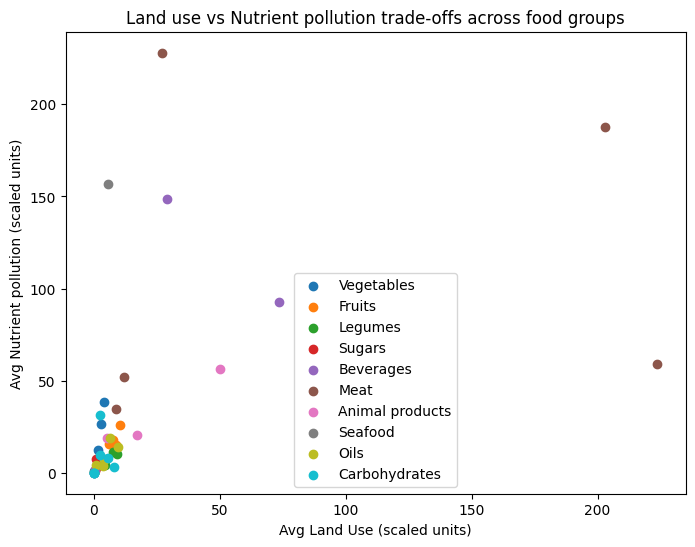

In [ ]:
plt.figure(figsize=(8,6))

for fg, df in df_dict.items():
    x = df[metrics_dict["Land use"]].mean(axis=1)
    y = df[metrics_dict["Nutrient pollution"]].mean(axis=1)
    plt.scatter(x, y, label=fg)

plt.xlabel("Avg Land Use (scaled units)")
plt.ylabel("Avg Nutrient pollution (scaled units)")
plt.legend()
plt.title("Land use vs Nutrient pollution trade-offs across food groups")
plt.show()


Individual Food product breakdown

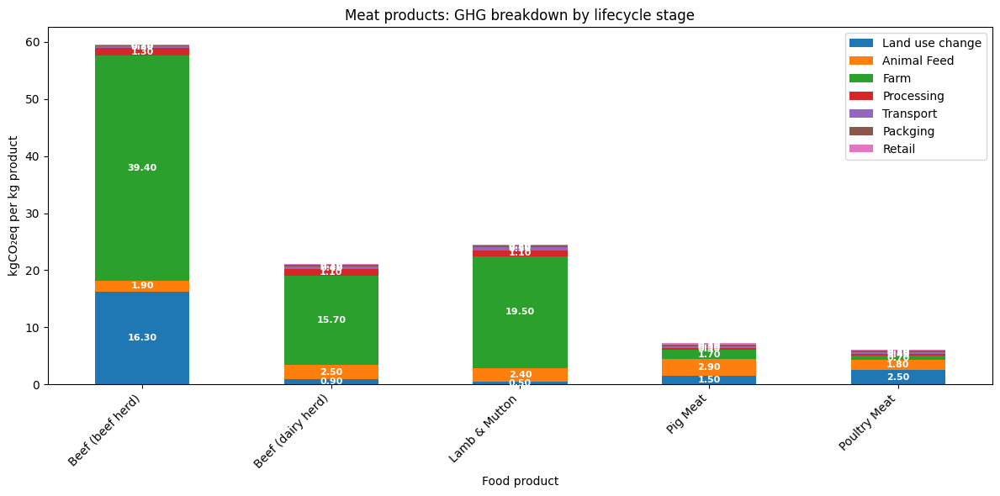

In [ ]:
ghg_cols = metrics_dict["GHG Emissions"][:7]  # lifecycle stages only

ax = df_meat.set_index("Food product")[ghg_cols].plot(
    kind="bar", stacked=True, figsize=(12, 6))

plt.title("Meat products: GHG breakdown by lifecycle stage")
plt.ylabel("kgCO₂eq per kg product")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()

# Add labels for each bar segment
for container in ax.containers:
    # add labels only for non-zero bars
    ax.bar_label(
        container,
        fmt="%.2f",          # format numbers (2 decimals)
        label_type="center", # put inside the segment
        fontsize=8,
        color="white",       # stands out against bar color
        fontweight="bold"
    )

plt.show()


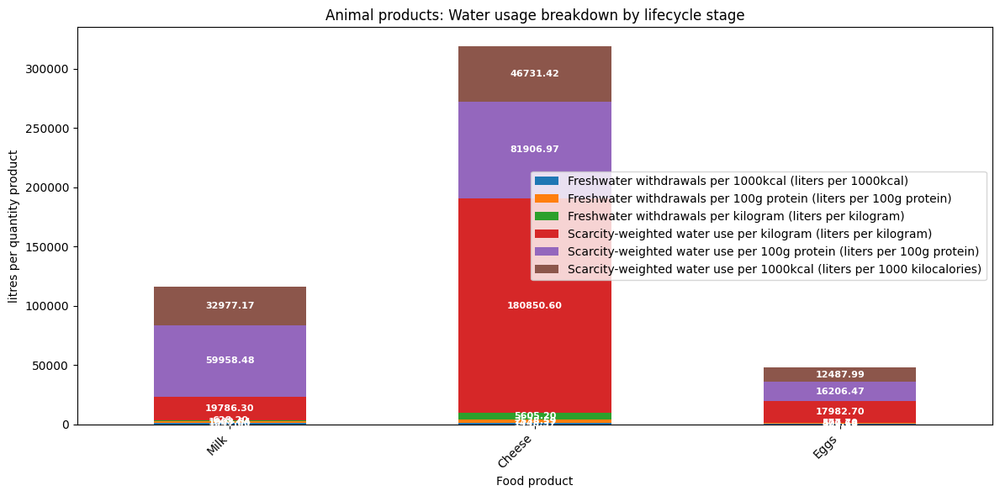

In [ ]:
water_cols = metrics_dict["Water use"][:7]

ax = df_animal_products.set_index("Food product")[water_cols].plot(
    kind="bar", stacked=True, figsize=(12,6))

plt.title("Animal products: Water usage breakdown by lifecycle stage")
plt.ylabel("litres per quantity product")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()

# Add labels for each bar segment
for container in ax.containers:
    # add labels only for non-zero bars
    ax.bar_label(
        container,
        fmt="%.2f",          # format numbers (2 decimals)
        label_type="center", # put inside the segment
        fontsize=8,
        color="white",       # stands out against bar color
        fontweight="bold"
    )

plt.show()


### Metrics definition and Insights

**Lifecycle Stages (GHG emissions components)**

---


Land use change → Emissions from clearing forests/grasslands for agriculture (e.g., deforestation for cattle ranching).

Animal feed → Emissions from growing crops used to feed livestock (fertilizer, machinery, land prep).

Farm → Direct on-farm emissions (methane from cows, nitrous oxide from soil, energy use).

Processing → Emissions from turning raw materials into edible products (slaughtering, milling, refrigeration, etc.).

Transport → Emissions from moving products along the supply chain.

Packaging → Emissions from producing and disposing of packaging materials.

Retail → Emissions from storage, refrigeration, and sale in shops/supermarkets.

Total_emissions → Sum of all lifecycle stage emissions (kg CO₂eq per kg of product).


**Pollution / Impact Metrics**

---


Eutrophying emissions (gPO₄eq) → Pollution that causes algae blooms and water quality loss (mainly from fertilizer runoff). Reported per:

per 1000 kcal (calorie-based efficiency)

per kilogram (mass-based impact)

per 100 g protein (protein efficiency impact)

Freshwater withdrawals (liters) → Amount of freshwater consumed, not accounting for scarcity. Reported per kcal, kg, and protein.

Greenhouse gas emissions (kgCO₂eq) → Total climate impact from farming to retail. Reported per kcal and protein.

Land use (m²) → Area of land required to produce food. Reported per kcal, kg, and protein.

Scarcity-weighted water use (liters) → Water use adjusted for local scarcity (withdrawals in water-stressed areas have higher impact). Reported per kcal, kg, and protein.

#### Insights

Different food groups have different emission issues. A one-stop-all solution is not possible to reduce the environmental impact caused by large-scale food production.



*   Meat has high levels of Green-House Gas emissions (GHGs), along with water use, land use and processing. Beef and cattle production releases large amounts of methane gas and require huge acres of land to accommodate animals. The proliferation of fast food chains which are also heavily dependent on processed meat from these same sources increase food processing based emissions. Sustainable farming methods as well as a cultural shift towards healthy dieting need to be developed to manage such emissions. Similar story for animal based products.
*   Similar to meat, carbohydrates require much land space for their cultivation, have high emissions due to transportation and packaging. The vehicles and machinery performing all such tasks at massive scales also emit high amounts of GHGs. Similar story for beverage production.
*    Fruit production, on the other hand, require heavy water supply and often need to be transported from one place to another especially due to climatic conditions and suitability in specific regions.
*    Oil production, much different, requires a lot more effort to process and package. High yield production of these products result in higher GHG emissions.

